#  Alternative ways of masking - SOM


In addition to convolutional techniques, GRIDGEN supports masks created using KDTree-based neighbour counting and Self-Organizing Maps (SOM).

We will test derive cancer stroma with both SOM and KDTree and find identify γδ T cell regions using KDtree approaches in Xenium CRC data. 

In [18]:
%load_ext autoreload

import os 
import sys
import time
import logging
import re
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import json
import anndata as ad
import scanpy as sc
import squidpy as sq
from natsort import natsorted
import matplotlib.colors as mcolors
np.random.seed(42)
import cv2
import copy
import seaborn as sns
sys.path.append(os.path.dirname(os.getcwd()))
from gridgen import get_arrays as ga
from gridgen import contours, get_masks 
from gridgen.mask_properties import MaskAnalysisPipeline, MaskDefinition
from gridgen.binsom import GetBins, GetContour

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


define the logger :  can be None, and is set to INFO

In [2]:
# define the logger :  can be None, and is set to INFO
# Custom logger setup
logger = logging.getLogger('contour_logger')
handler = logging.StreamHandler()
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)
logger.setLevel(logging.INFO)

# SOM-based Cancer Stroma Identification

SOM-based mask generation applies the SOM algorithm to bins of image data, classifying each bin in an unsupervised manner. The bin size can be adjusted to control the granularity of the masks, while the number of SOM units determines the number of resulting groups. 

In this study, we used SOM with two units, leading to an unsupervised separation of stromal and cancer compartments,  distinction supported by differential gene expression observed between the two classes. This offers a possibility of deriving masks in an unsupervised fashion.

Get the files

In [3]:
xenium_path =  '../../xenium_data/HLA/GD_TMA1_S3/fov_filtered'

to_exclude = [
    'TMA1_Selection14_filtered.csv' , # little tumour
    'TMA1_Selection15_filtered.csv', # tonsil
    'TMA1_Selection18_filtered.csv' , # normal
    'TMA1_Selection24_filtered.csv', # tonsl 
    'TMA1_Selection27_filtered.csv', # low quality
    'TMA1_Selection32_filtered.csv', # low quality
    'TMA1_Selection33_filtered.csv', # low quality
             ]
files_tma1 = os.listdir(xenium_path)
files = [os.path.join(xenium_path, file) for file in files_tma1 if file not in to_exclude]
print(len(files))

20


Use an example file

In [4]:
# we will do for a single file 
file_csv = files[7]
filename = os.path.basename(file_csv).split('.')[0] # Extract the filename without extension
name_file = '_'.join(filename.split('_')[:2])# Extract the desired part

df_total = pd.read_csv(file_csv)
df_total = df_total[['x_location', 'y_location', 'feature_name']]
df_total = df_total.rename(columns={'feature_name': 'target'})
df_total = df_total[~df_total['target'].str.contains('System|egative')]
df_total['X'] = df_total['x_location'] - min(df_total['x_location'])
df_total['Y'] = df_total['y_location'] - min(df_total['y_location'])

n_genes = len(df_total['target'].unique())
height = int(max(df_total['X'])) + 1
width = int(max(df_total['Y'])) + 1

print(f'n genes: {n_genes}')
print(f'shape: {height}, {width}')
print(f'n hits {len(df_total)}')

n genes: 480
shape: 1809, 1769
n hits 4433228


***SOM pipeline***

First we will divide the image in bins. In this case, we will use non overlapping bins. 

The counts of eachbin with all the space information are saved in an adata object. 

Preprocess bin applies single cell normalization pipeline to the bin information (normalize total and log1) and filters out empty bins <10 counts.

In [5]:
bin_size = 5  # 10
min_counts = 10 # 10
unique_targets = df_total['target'].unique()

GB = GetBins(bin_size, unique_targets, logger)
GB.get_bin_cohort(df_list= [df_total], df_name_list = [name_file], cohort_name = 'HLA')
GB.preprocess_bin(min_counts = min_counts)
adata = GB.adata

2025-06-17 22:48:02,696 - contour_logger - INFO - Time to get bins for 1 dataframes: 2.22 seconds
2025-06-17 22:48:02,697 - contour_logger - INFO - Number of bins: 99374
2025-06-17 22:48:02,697 - contour_logger - INFO - Number of genes: 480


With the bins of the images, we can apply the SOM clustering. 

We will apply a SOM map with 2 cells, and see if it accurately divides cancer and stroma compartments.

In [6]:
GC = GetContour(adata, logger)
GC.run_som(som_shape = (2,1), n_iter = 5000, sigma=.5, learning_rate=.5, random_state = 42)

2025-06-17 22:48:04,084 - contour_logger - INFO - Time to run som on 78461 bins: 0.92
2025-06-17 22:48:04,085 - contour_logger - INFO - Number of clusters: 2
2025-06-17 22:48:04,086 - contour_logger - INFO - number of bins in each cluster: cluster_som
0    42722
1    35739
Name: count, dtype: int64


As you can see, the fitting process is nearly instantaneous. 

We can now evaluate the differentially expressed genes using the GC.adata object and perform the preferred analyses. Additionally, you can apply GC.eval_som_statistical for further evaluation.

In [7]:
GC.eval_som_statistical(top_n=10)

2025-06-17 22:48:05,116 - contour_logger - INFO - n top genes for group 0
2025-06-17 22:48:05,118 - contour_logger - INFO - 
     names      scores  logfoldchanges  pvals  pvals_adj group
0    EPCAM  496.127167        4.710810    0.0        0.0     0
1    KRT18  401.328308        4.123829    0.0        0.0     0
2     LCN2  350.054199        4.303699    0.0        0.0     0
3     KRT8  204.175812        3.766609    0.0        0.0     0
4    CCL20  203.358932        3.733404    0.0        0.0     0
5      CA9  167.450836        4.739976    0.0        0.0     0
6    BIRC3  165.406113        3.378658    0.0        0.0     0
7    HLA-G  163.212875        1.587320    0.0        0.0     0
8   IFITM1  163.142197        2.525657    0.0        0.0     0
9  CEACAM1  161.894699        4.590243    0.0        0.0     0
2025-06-17 22:48:05,123 - contour_logger - INFO - n top genes for group 1
2025-06-17 22:48:05,125 - contour_logger - INFO - 
     names      scores  logfoldchanges  pvals  pvals_adj 

From the gene patterns, it appears that the SOM is effectively separating the bins based on stroma vs. cancer regions.

Let’s visualize this in two different ways:

    * Reconstructing the bins into an image — we can use GC.get_som_2d_image(bin_size=10) to transform the bins back into an image and plot it with GC.plot_som.

    * Plotting the centroids with Squidpy — we can leverage the centroids stored in the adata object to plot only the centroid points (note that all bins have the same size in this case).

TMA1_Selection22


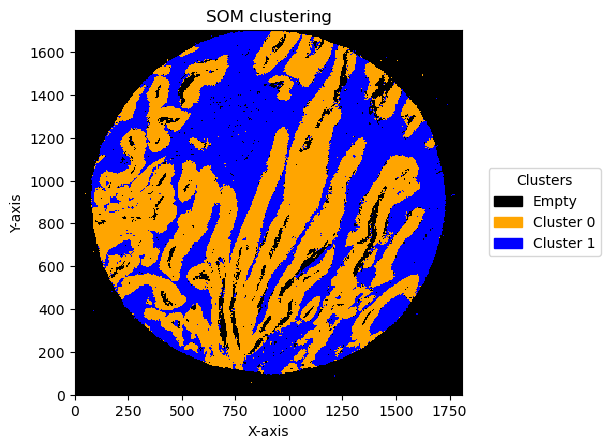

In [8]:
som_images = GC.get_som_2d_image(bin_size = 5)

# Create a custom colormap and legends 
cmap = mcolors.ListedColormap(['black', 'orange', 'blue',])
legend_labels = {0: 'Empty', 1: 'Cluster 0', 2: 'Cluster 1'}

for name, som_image in som_images.items():
    print(name)
    GC.plot_som(som_image, cmap = cmap, path=None, show=True, figsize=(5, 5), ax=None, legend_labels=legend_labels)

TMA1_Selection22


/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


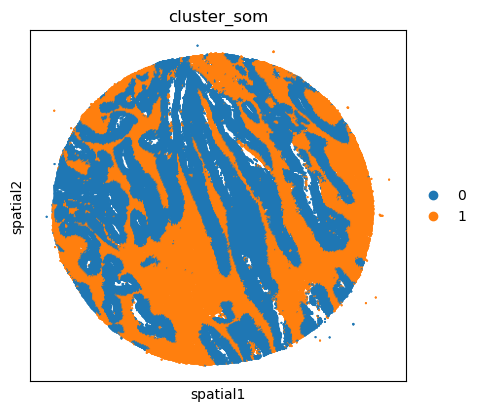

In [9]:
# adata.obsm["spatial"] = adata.obs[["x_centroid", "y_centroid"]].copy().to_numpy()
unique_cases =adata.obs['name'].unique()
for case in unique_cases:
    # Filter the AnnData object for the current case
    adata_case = adata[adata.obs['name'] == case, :]
    print(case)
    plt.rcParams["figure.figsize"] = (5, 4)
    sq.pl.spatial_scatter(
            adata_case,
            library_id='name',
            shape=None,
            color=["cluster_som"],
            size=1,
    )
    plt.show()

We can use this information to build masks, as we saw earlier, based on the contours defined by gene expression patterns.

The SOM clusters are numbered, but we need to assign biological identities to these clusters.
By running GC.eval_som_statistical(top_n=10), we observe that:

    Cluster 1 corresponds to Stroma, characterized by marker genes such as SPARC, COL1A1, VIM, etc.

    Cluster 0 corresponds to Tumor, marked by genes like EPCAM, KRT18, KRT8, and others.

2025-06-17 22:48:14,931 - gridgen.get_masks.GetMasks - INFO - Initialized GetMasks


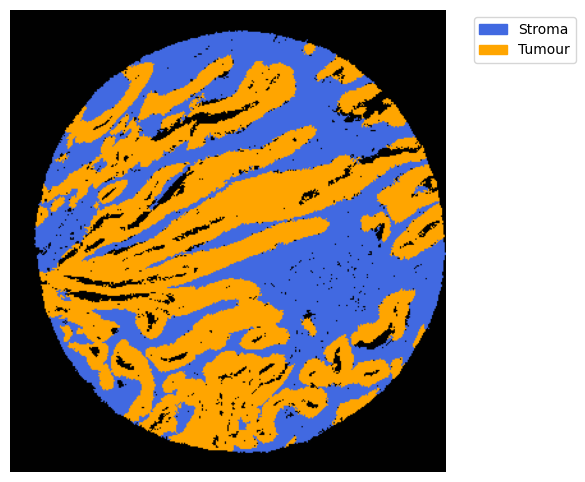

In [10]:
name, som_image = list(som_images.items())[0]
# pass the contour area threshold
GM = get_masks.GetMasks(image_shape = (som_image.shape[0], som_image.shape[1]))
mask_S = (som_image==2).astype(np.uint8) * 255
GM.mask_S = (GM.filter_binary_mask_by_area(mask_S, min_area=700))
mask_T = (som_image==1).astype(np.uint8) * 255
GM.mask_T = (GM.filter_binary_mask_by_area(mask_T, min_area=700))

GM.plot_masks(masks=[GM.mask_S, GM.mask_T], mask_names = ['Stroma', 'Tumour'],
          background_color=(1, 1, 1), 
              mask_colors={'Stroma': (65, 105, 225), 'Tumour': (255, 165, 0)},   # {'Stroma': (0, 0, 255), 'Tumour': (255, 0, 0)
              figsize= (6,6),
              path=None, show=True, ax=None)

With the masks, we can proceed and do the remaining pipeline with expansions, resuming mask information and hierarchy analysis as described in other notebooks.  Important parameters include the bin size and the number of units in SOM (see appropriate notebook).

**Full pipeline**

In this case, instead of performing the binning per image we will apply to a full cohort. 

obtain list of dfs 

In [11]:
df_list = []
df_name_list = []
for file_csv in tqdm(files, desc="Processing Folders", unit="folder"):
    start_time = time.time()
    
    df_total = pd.read_csv(file_csv)

    df_total = df_total[['x_location', 'y_location', 'feature_name']]
    df_total = df_total.rename(columns={'feature_name': 'target'})
    df_total = df_total[~df_total['target'].str.contains('System|egative')]
    df_total['X'] = df_total['x_location'] - min(df_total['x_location'])
    df_total['Y'] = df_total['y_location'] - min(df_total['y_location'])
    
    # Extract the file name with extension
    file_name_with_ext = os.path.basename(file_csv)
    file_name = os.path.splitext(file_name_with_ext)[0]     # Remove the .csv extension
    df_list.append(df_total)
    df_name_list.append(file_name)

Processing Folders:  90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████            | 18/20 [01:00<00:06,  3.38s/folder]/tmp/ipykernel_3631713/2623634986.py:6: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df_total = pd.read_csv(file_csv)
Processing Folders: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [01:05<00:00,  3.29s/folder]


Get the bins of all the images in the cohort

In [12]:
bin_size = 10  
min_counts = 20 
unique_targets = df_total['target'].unique()

GB = GetBins(bin_size, unique_targets, logger)
GB.get_bin_cohort(df_list, df_name_list, cohort_name = 'HLA')
GB.preprocess_bin(min_counts = min_counts)
adata = GB.adata

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
2025-06-17 22:49:45,883 - contour_logger - INFO - Time to get bins for 20 dataframes: 21.68 seconds
2025-06-17 22:49:45,883 - contour_logger - INFO - Number of bins: 551546
2025-06-17 22:49:45,883 - contour_logger - INFO - Number of genes: 480
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Get contours with a SOM with (2,1) shape

In [14]:
GC = GetContour(adata, logger)
GC.run_som(som_shape = (2,1), n_iter = 5000, sigma=.5, learning_rate=.5, random_state = 42)
som_images = GC.get_som_2d_image(bin_size = bin_size)
GC.eval_som_statistical(top_n=10)

2025-06-17 22:50:25,088 - contour_logger - INFO - Time to run som on 375638 bins: 3.90
2025-06-17 22:50:25,091 - contour_logger - INFO - Number of clusters: 2
2025-06-17 22:50:25,093 - contour_logger - INFO - number of bins in each cluster: cluster_som
0    249093
1    126545
Name: count, dtype: int64
2025-06-17 22:50:42,743 - contour_logger - INFO - n top genes for group 0
2025-06-17 22:50:42,745 - contour_logger - INFO - 
    names      scores  logfoldchanges  pvals  pvals_adj group
0   SPARC  628.395996        4.158346    0.0        0.0     0
1     VIM  558.854919        3.332307    0.0        0.0     0
2  COL1A1  558.634033        3.965682    0.0        0.0     0
3  IGFBP7  523.938293        4.027341    0.0        0.0     0
4  COL3A1  497.098663        4.770787    0.0        0.0     0
5     LUM  451.008423        4.369345    0.0        0.0     0
6   TAGLN  445.750000        4.511294    0.0        0.0     0
7   TIMP2  385.620026        2.833496    0.0        0.0     0
8  COL6A2  375

In [15]:
GC.eval_som_statistical_df

,names,scores,logfoldchanges,pvals,pvals_adj,group
0,SPARC,628.395996,4.158346,0.0,0.0,0
1,VIM,558.854919,3.332307,0.0,0.0,0
2,COL1A1,558.634033,3.965682,0.0,0.0,0
3,IGFBP7,523.938293,4.027341,0.0,0.0,0
4,COL3A1,497.098663,4.770787,0.0,0.0,0
5,LUM,451.008423,4.369345,0.0,0.0,0
6,TAGLN,445.750000,4.511294,0.0,0.0,0
7,TIMP2,385.620026,2.833496,0.0,0.0,0
8,COL6A2,375.963989,4.444396,0.0,0.0,0
9,COL4A1,360.146545,3.352051,0.0,0.0,0


In [16]:
adata.obs['cluster_som'].value_counts()

cluster_som
0    249093
1    126545
Name: count, dtype: int64

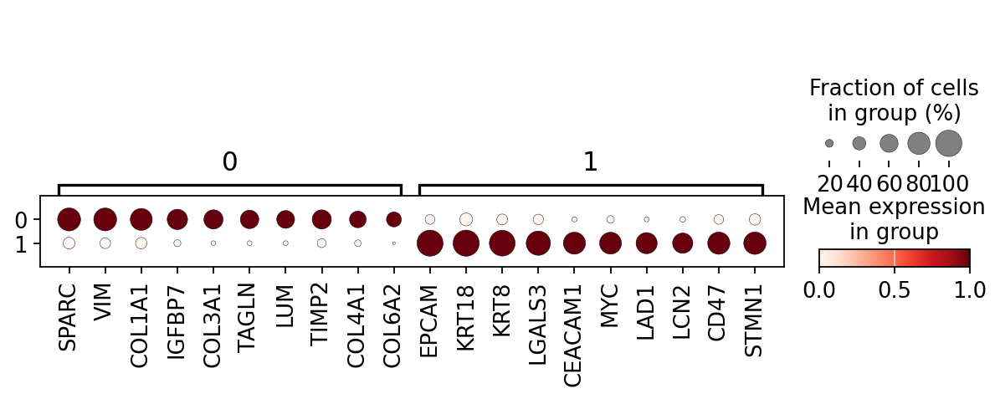

In [19]:
column_name = 'cluster_som'
groupcl = copy.deepcopy(adata)
groupcl.obs[column_name] = pd.Categorical(
    groupcl.obs[column_name],
    categories=[0, 1],  # ← integer categories
#     categories=[ '0','1'],
    ordered=True
)

# groupcl.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(groupcl,column_name, method='wilcoxon', pts=True)
sc.tl.filter_rank_genes_groups(groupcl, groupby=column_name, min_fold_change=1)

# Extract the results
result = groupcl.uns['rank_genes_groups']
groups = result['names'].dtype.names

# Create a DataFrame to store the results
results_df = pd.DataFrame()
for group in groups:
    group_df = pd.DataFrame({
        'gene': result['names'][group],
        'logfoldchanges': result['logfoldchanges'][group],
        'pvals': result['pvals'][group],
        'pvals_adj': result['pvals_adj'][group],
        'scores': result['scores'][group]
    })
    group_df['mask'] = group
    results_df = pd.concat([results_df, group_df], ignore_index=True)

sc.set_figure_params(scanpy=True, fontsize=14)

dotplot = sc.pl.rank_genes_groups_dotplot(
    groupcl,
    groupby=column_name,
    standard_scale="var",
    n_genes=10, #15
    dendrogram=True,
    return_fig=True,
#     swap_axes=True,
)
dotplot.savefig('figures/dotplot_highres.png', dpi=500, bbox_inches='tight')

/tmp/ipykernel_3631713/4040328311.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  heatmap_ax.figure.tight_layout()


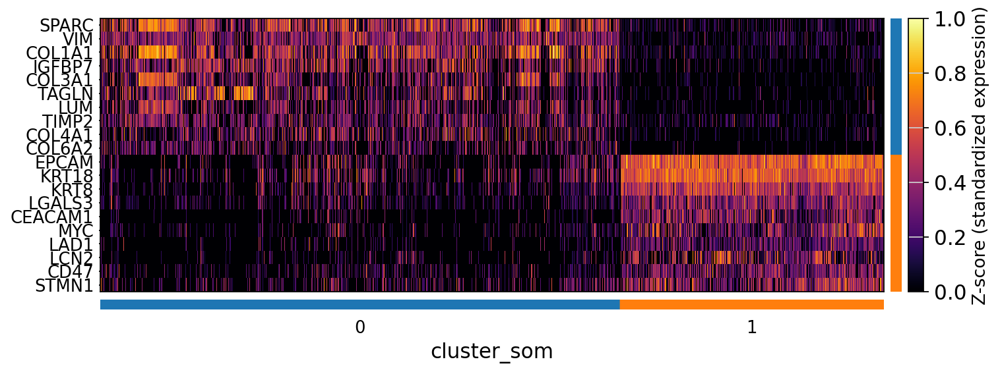

In [21]:
heatmap_dict = sc.pl.rank_genes_groups_heatmap(
    groupcl,
    groupby=column_name,
    n_genes=10,
    cmap='inferno',
    dendrogram=False,
    standard_scale='var',
    swap_axes=True,
    return_fig=True,
    show=False
)

# Get the heatmap axis
heatmap_ax = heatmap_dict["heatmap_ax"]

# Add label to the colorbar if it exists
for im in heatmap_ax.get_images():
    if hasattr(im, 'colorbar') and im.colorbar is not None:
        im.colorbar.set_label("Z-score (standardized expression)", fontsize=12)

# Save the full figure (not just the axis!)
heatmap_ax.figure.tight_layout()
heatmap_ax.figure.savefig("figures/heatmap_with_label.png", dpi=300)


plot

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


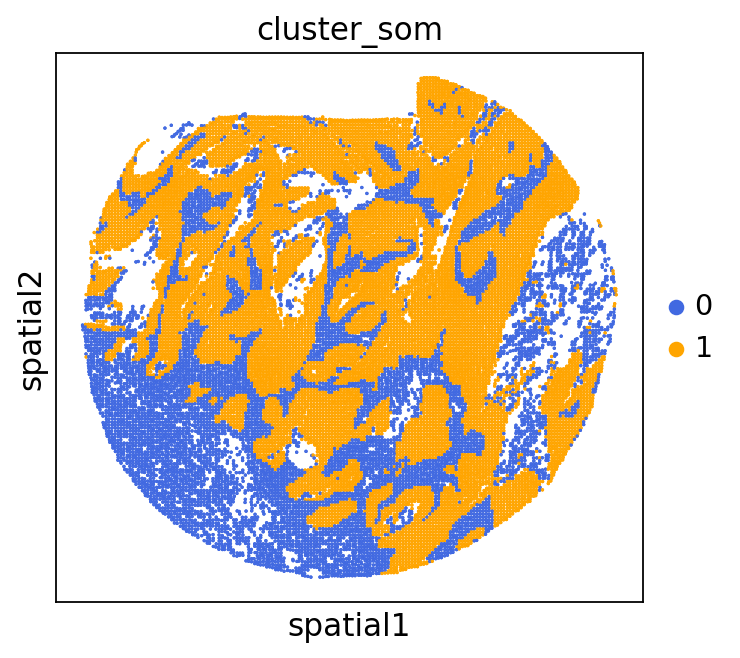

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


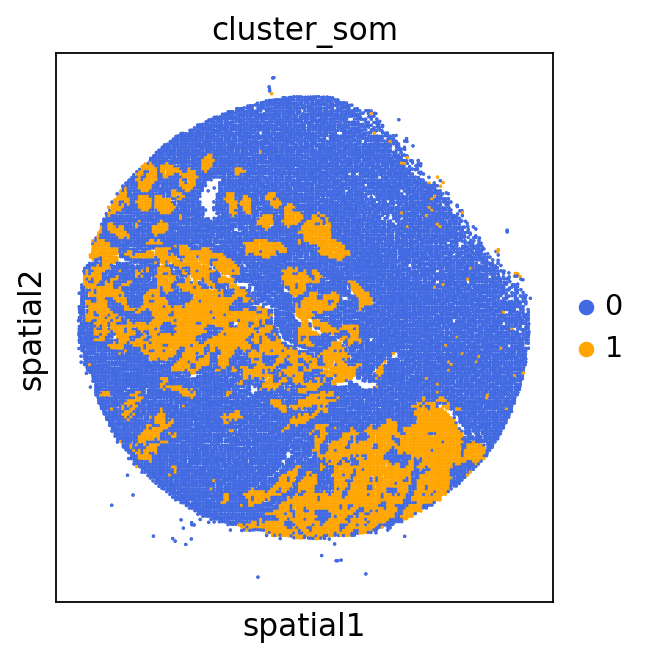

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


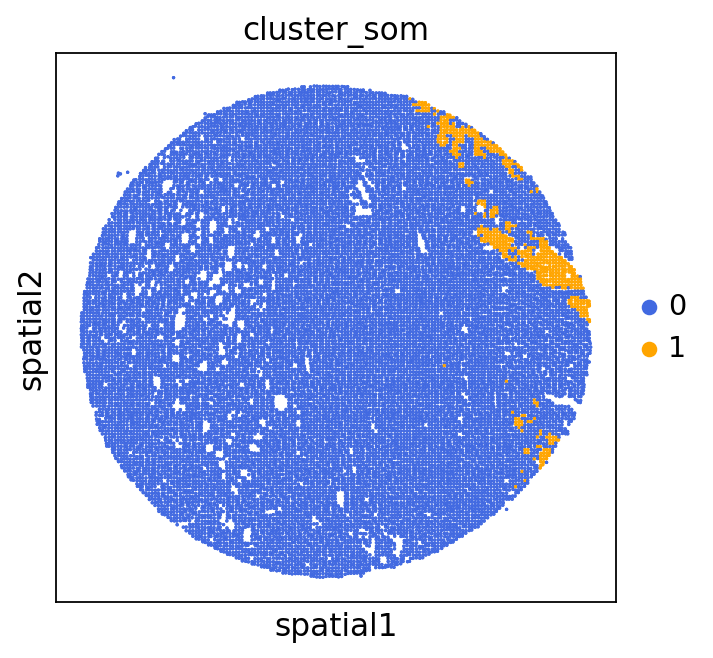

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


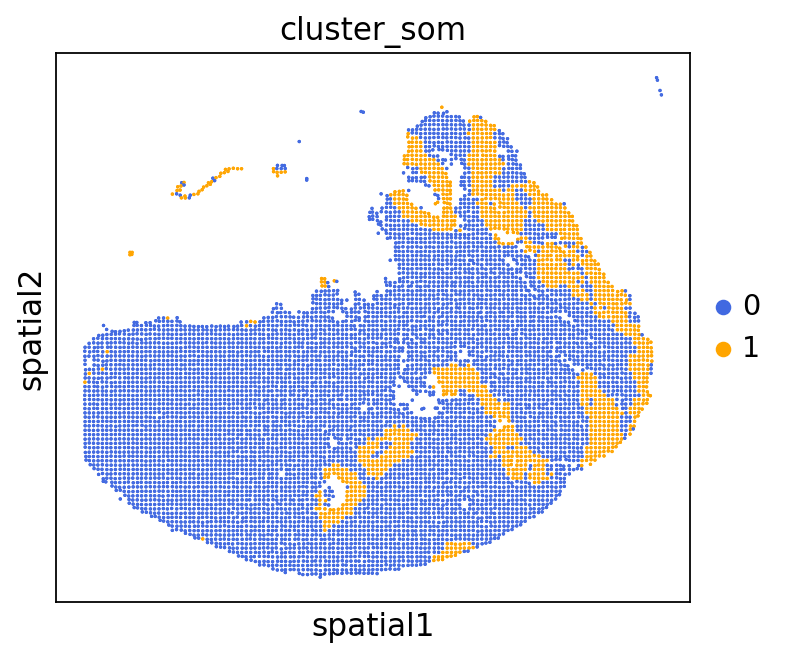

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


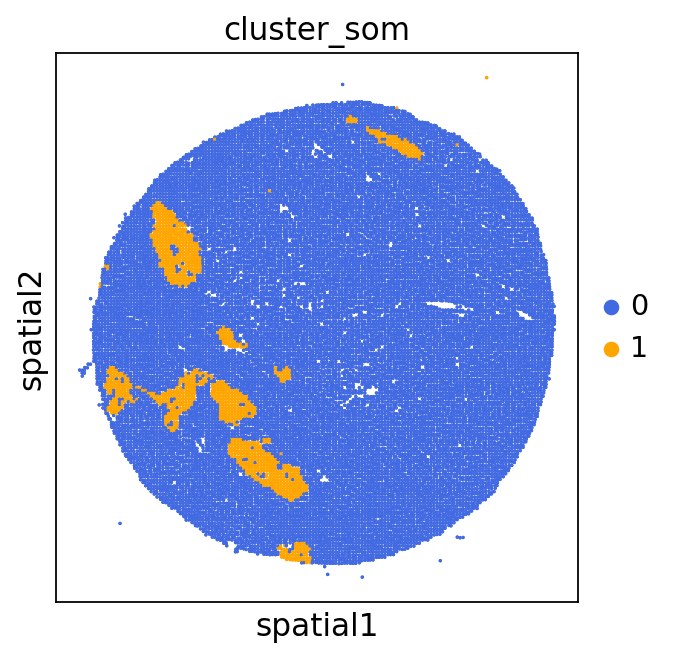

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


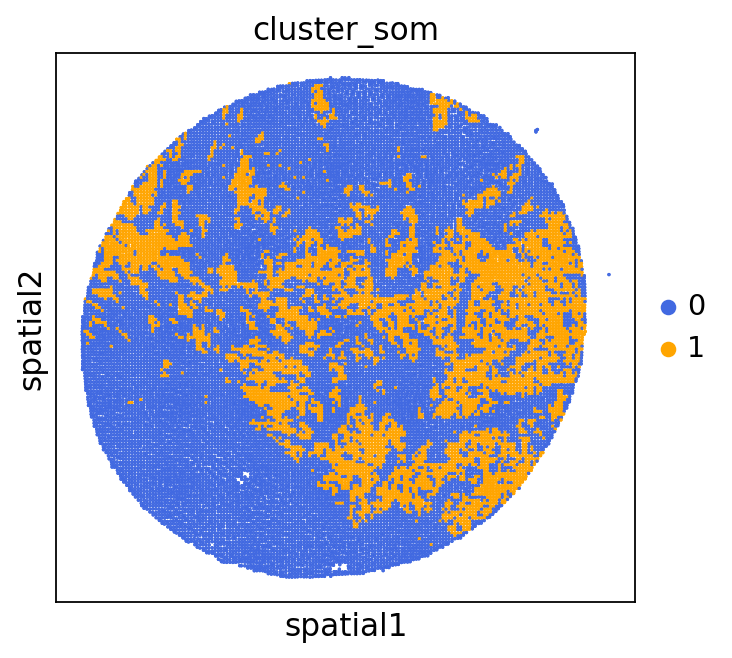

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


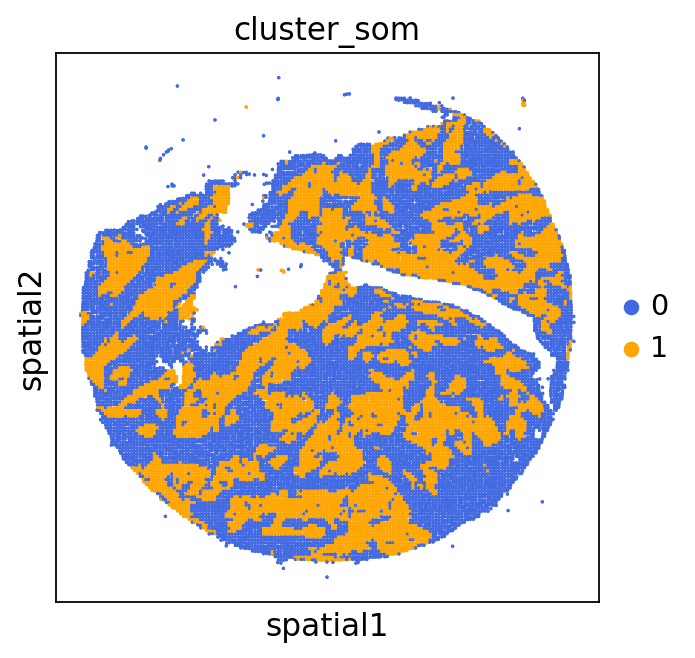

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


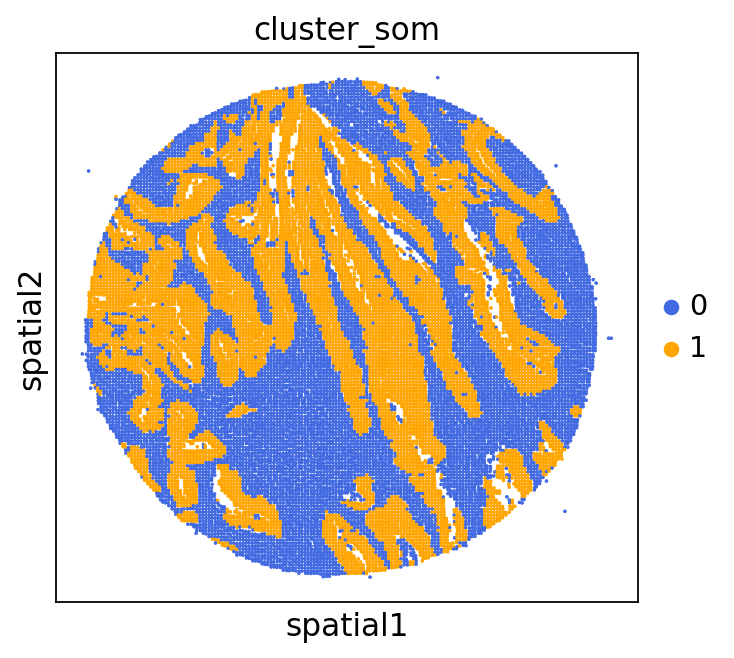

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


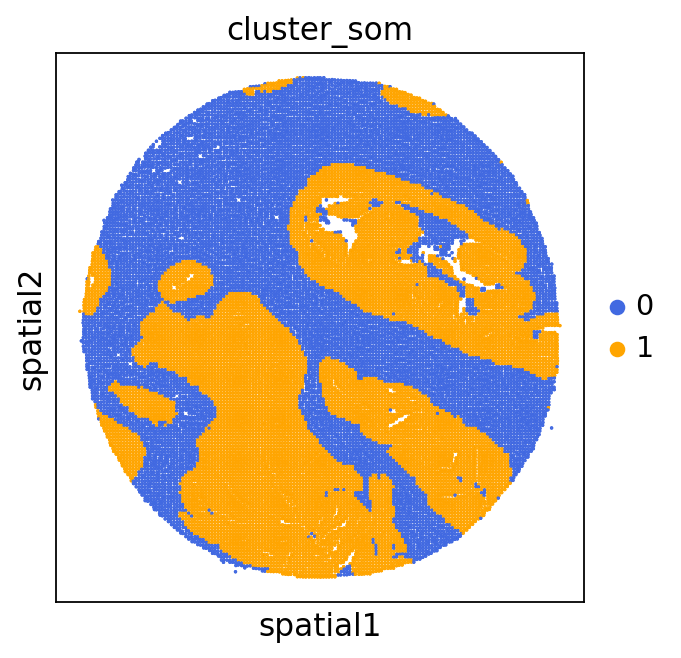

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


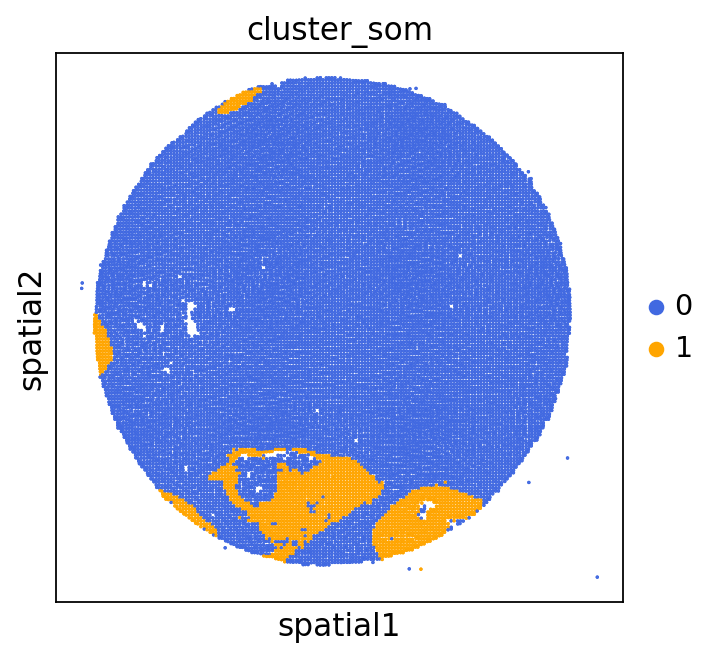

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


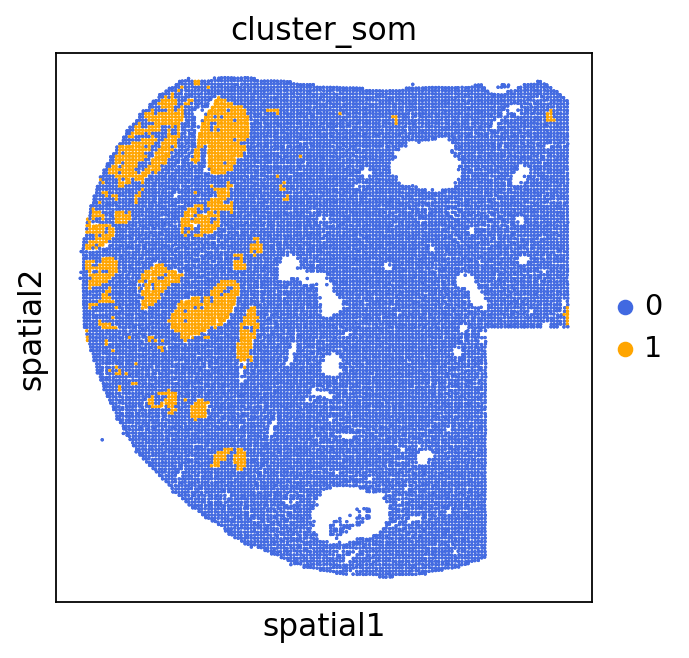

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


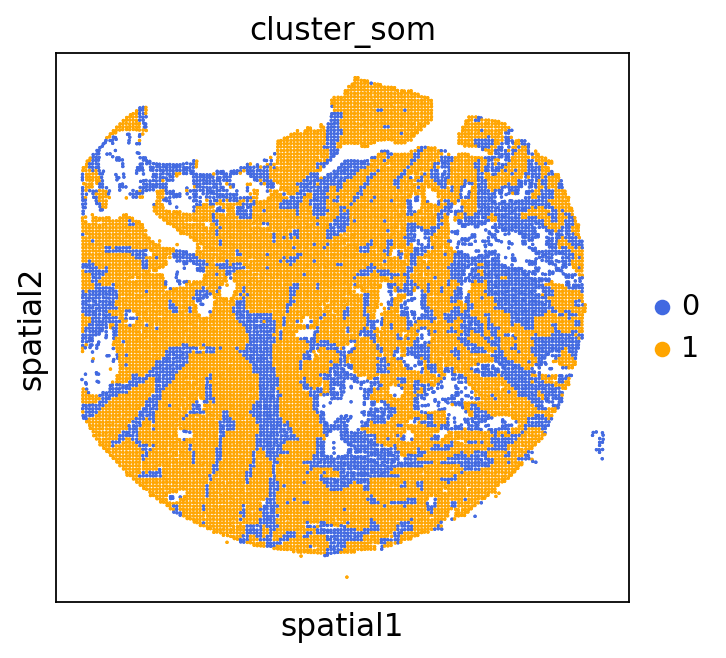

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


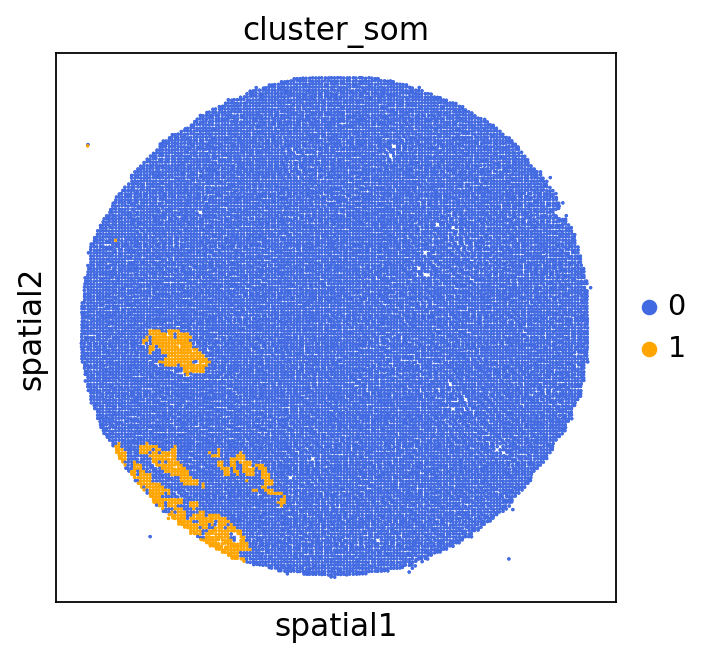

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


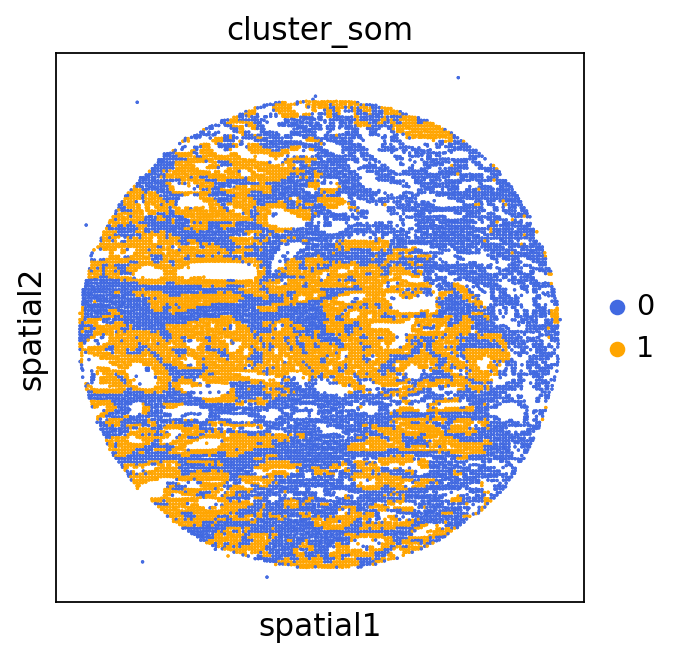

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


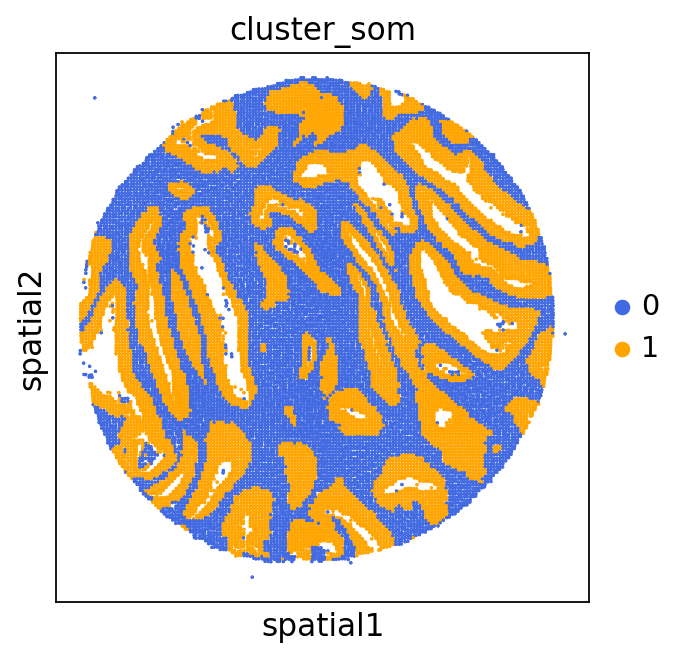

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


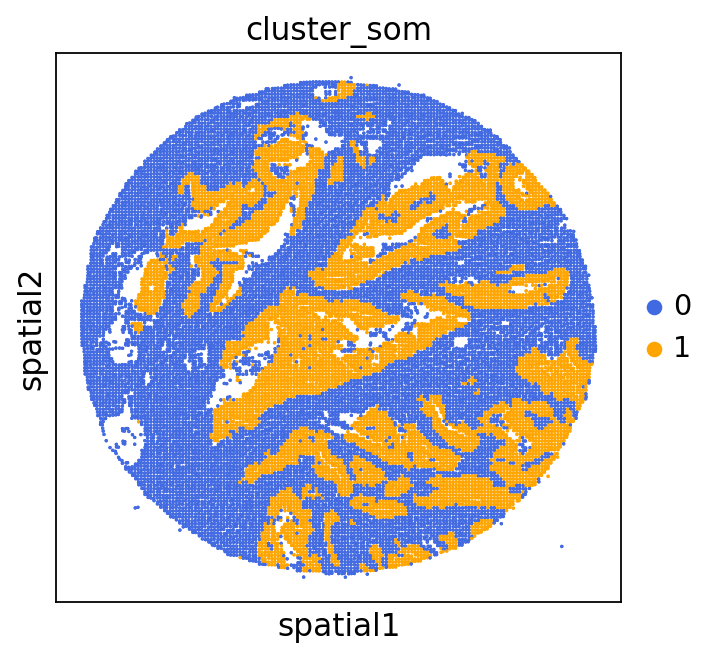

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


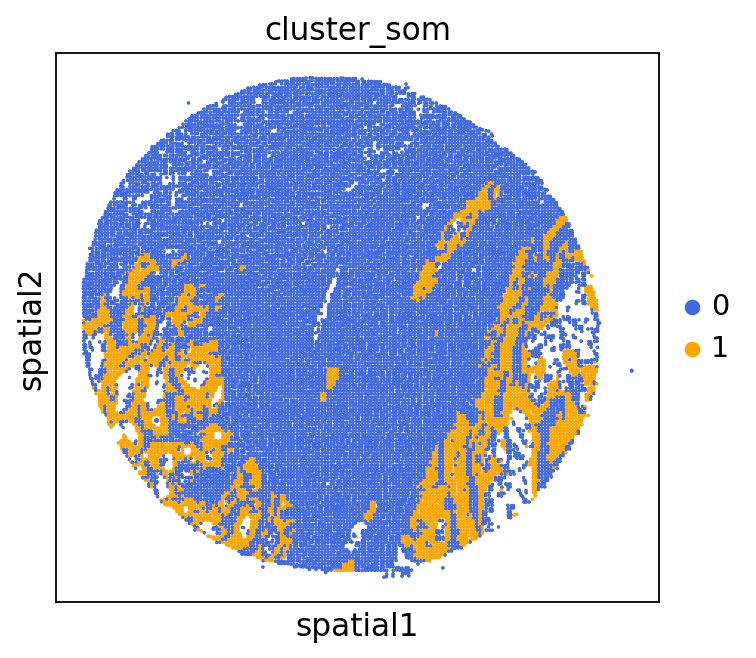

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


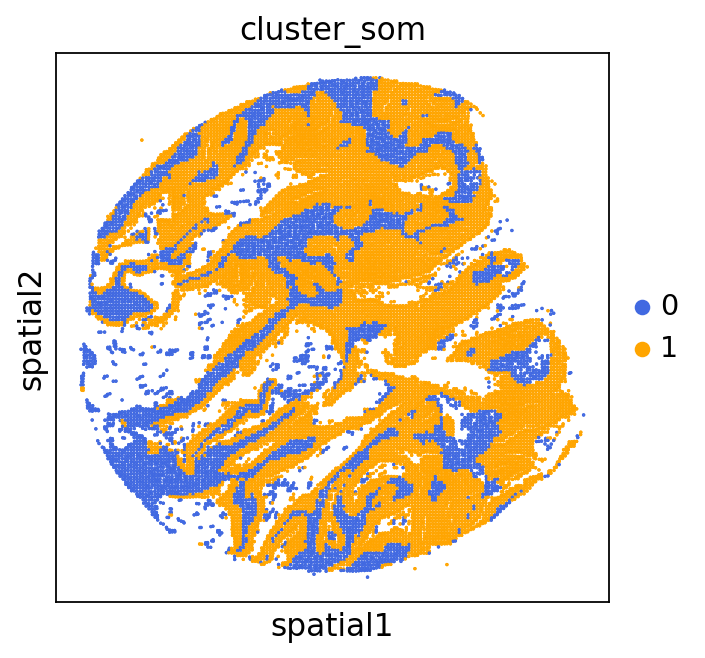

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


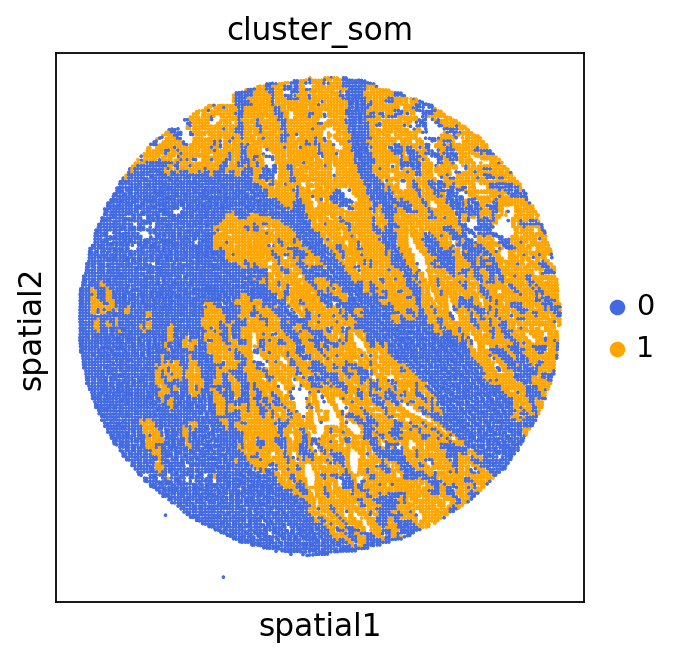

/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/GRIDGEN/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


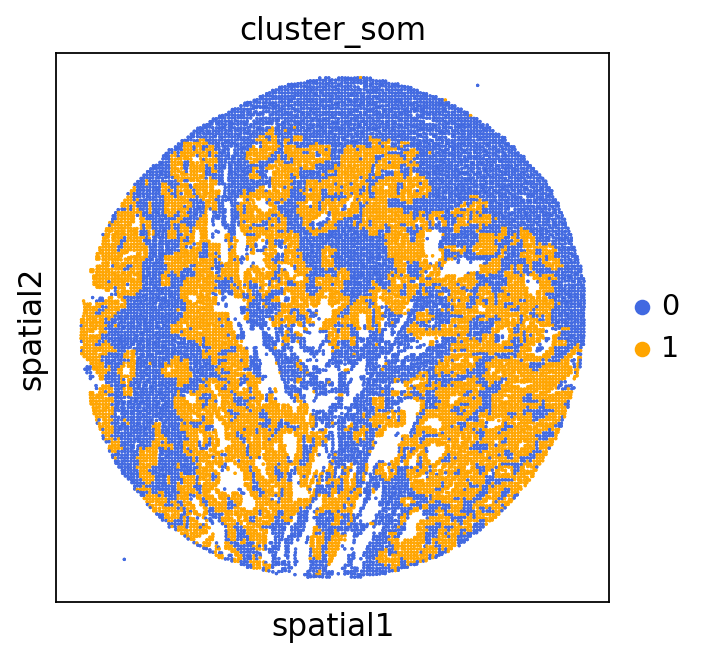

In [22]:
adata = GC.adata
unique_cases =adata.obs['name'].unique()
mask_colors = {
    0: (65/255, 105/255, 225/255),  # RoyalBlue
    1: (255/255, 165/255, 0/255),   # Orange
}

categories = adata.obs['cluster_som'].cat.categories
palette_list = [mask_colors[cat] for cat in categories]

# Convert the list of colors to a ListedColormap
palette_cmap = mcolors.ListedColormap(palette_list)


for case in unique_cases:
    # Filter the AnnData object for the current case
    adata_case = adata[adata.obs['name'] == case, :]
    plt.rcParams["figure.figsize"] = (5, 4)
    sq.pl.spatial_scatter(
            adata_case,
            library_id='name',
            shape=None,
            color=["cluster_som"],
            size=1,
            palette=palette_cmap  # pass the colormap object

    )
    plt.show()

In [23]:
# for saving  
# for case in unique_cases:
#     adata_case = adata[adata.obs['name'] == case, :]

#     plt.rcParams["figure.figsize"] = (5, 4)
#     fig = plt.figure()

#     ax = fig.add_subplot(111)
#     sq.pl.spatial_scatter(
#         adata_case,
#         library_id='name',
#         shape=None,
#         color=["cluster_som"],
#         size=1,
#         palette=palette_cmap,
#         ax=ax,
#     )

#     # Remove x/y labels, ticks, title, and legend
#     ax.set_xlabel('')
#     ax.set_ylabel('')
#     ax.set_xticks([])
#     ax.set_yticks([])
#     ax.set_title('')
#     ax.legend().remove() if ax.get_legend() else None

#     # Save figure
#     fig.savefig(f"results/som/{case}.png", bbox_inches='tight', dpi=400, pad_inches = 0.05)
#     plt.close(fig)